In [3]:
import pandas as pd
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dense, Dropout
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.preprocessing import StandardScaler
import seaborn as sns

In [2]:
pip install tensorflow

  Obtaining dependency information for tensorflow from https://files.pythonhosted.org/packages/93/21/9b035a4f823d6aee2917c75415be9a95861ff3d73a0a65e48edbf210cec1/tensorflow-2.15.0-cp311-cp311-win_amd64.whl.metadata
  Obtaining dependency information for tensorflow-intel==2.15.0 from https://files.pythonhosted.org/packages/4c/48/1a5a15517f18eaa4ff8d598b1c000300b20c1bb0e624539d702117a0c369/tensorflow_intel-2.15.0-cp311-cp311-win_amd64.whl.metadata
  Obtaining dependency information for absl-py>=1.0.0 from https://files.pythonhosted.org/packages/01/e4/dc0a1dcc4e74e08d7abedab278c795eef54a224363bb18f5692f416d834f/absl_py-2.0.0-py3-none-any.whl.metadata
  Using cached absl_py-2.0.0-py3-none-any.whl.metadata (2.3 kB)
  Using cached astunparse-1.6.3-py2.py3-none-any.whl (12 kB)
  Obtaining dependency information for flatbuffers>=23.5.26 from https://files.pythonhosted.org/packages/6f/12/d5c79ee252793ffe845d58a913197bfa02ae9a0b5c9bc3dc4b58d477b9e7/flatbuffers-23.5.26-py2.py3-none-any.whl.metada

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
commonroad-io 2023.3 requires protobuf==3.20.1, but you have protobuf 4.23.4 which is incompatible.


In [2]:
import pandas as pd

# Read collision data
collision_df_2 = pd.read_excel("C:/Users/saiko/Desktop/699/Task-10/collision_data2.xlsx", header=0, names=["time", "type", "lane", "pos", "collider", "victim", "colliderType", "victimType", "colliderSpeed", "victimSpeed"])

# Read FCD data
fcd_df_2 = pd.read_excel("C:/Users/saiko/Desktop/699/Task-10/fcd_data2.xlsx")


In [3]:
import pandas as pd

# Read collision data
collision_df_1 = pd.read_excel("C:/Users/saiko/Desktop/699/Task-10/collision_data1.xlsx", header=0, names=["time", "type", "lane", "pos", "collider", "victim", "colliderType", "victimType", "colliderSpeed", "victimSpeed"])

# Read FCD data
fcd_df_1 = pd.read_excel("C:/Users/saiko/Desktop/699/Task-10/fcd_data1.xlsx")


In [4]:
import pandas as pd

# Read collision data
collision_df = pd.read_excel("C:/Users/saiko/Desktop/699/Task-9/collision_data.xlsx", header=None, names=["time", "type", "lane", "pos", "collider", "victim", "colliderType", "victimType", "colliderSpeed", "victimSpeed"])

# Read FCD data
fcd_df = pd.read_excel("C:/Users/saiko/Desktop/699/Task-9/FCD_Output.xlsx")


In [5]:
import pandas as pd

# Read collision data
collision_df_3 = pd.read_excel("C:/Users/saiko/Desktop/699/Task-10/collision_data3.xlsx", header=0, names=["time", "type", "lane", "pos", "collider", "victim", "colliderType", "victimType", "colliderSpeed", "victimSpeed"])

# Read FCD data
fcd_df_3 = pd.read_excel("C:/Users/saiko/Desktop/699/Task-10/fcd_data3.xlsx")


In [6]:
import pandas as pd

# Read collision data
collision_df_4 = pd.read_excel("C:/Users/saiko/Desktop/699/Task-10/collision_data5.xlsx", header=0, names=["time", "type", "lane", "pos", "collider", "victim", "colliderType", "victimType", "colliderSpeed", "victimSpeed"])

# Read FCD data
fcd_df_4 = pd.read_excel("C:/Users/saiko/Desktop/699/Task-10/fcd_data5.xlsx")


In [7]:
collision_df

,time,type,lane,pos,collider,victim,colliderType,victimType,colliderSpeed,victimSpeed
0,20.5,collision,-E1_1,83.28,EGOVEHICLE,f_4.2,EGOVEHICLE,DEFAULTVEHCILE,11.23,3.07


In [8]:
collision_df_1

,time,type,lane,pos,collider,victim,colliderType,victimType,colliderSpeed,victimSpeed
0,7.1,collision,E5_0,99.07,EGOVEHICLE,f_1.4,EGOVEHICLE,DEFAULTVEHCILE,10.13,9.02


In [9]:
collision_df_2

,time,type,lane,pos,collider,victim,colliderType,victimType,colliderSpeed,victimSpeed
0,19.8,collision,-E1_1,55.17,EGOVEHICLE,f_4.2,EGOVEHICLE,DEFAULTVEHCILE,3.89,3.59


In [10]:
import pandas as pd
import numpy as np

def calculate_nearest_vehicle(df):
    """
    Calculate the nearest vehicle ID, least distance, and relative speed for each vehicle.

    Parameters:
    df (DataFrame): A pandas DataFrame with columns 'time', 'lane', 'vehicle_id', 'position', and 'speed'.

    Returns:
    DataFrame: The modified DataFrame with added columns for nearest vehicle ID, least distance, and relative speed.
    """
    # Group the DataFrame by 'time' and 'lane'
    grouped = df.groupby(['time', 'lane'])

    # Create empty columns to store nearest vehicle ID, least distance, and relative speed
    df['nearest_vehicle_id'] = "0"
    df['least_distance'] = 0.0
    df['relative_speed'] = 0.0

    for name, group in grouped:
        for index, row in group.iterrows():
            id_pos = row['position']
            id_speed = row['speed']
            other_vehicles = group[group['vehicle_id'] != row['vehicle_id']]  # Exclude the same vehicle

            # Calculate distance to other vehicles
            other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)

            if not other_vehicles.empty:
                # Find the row of the nearest vehicle
                min_distance_row = other_vehicles.loc[other_vehicles['distance_to_' + str(row['vehicle_id'])].idxmin()]
                df.at[index, 'nearest_vehicle_id'] = min_distance_row['vehicle_id']
                df.at[index, 'least_distance'] = min_distance_row['distance_to_' + str(row['vehicle_id'])]

                # Calculate relative speed
                nearest_vehicle_speed = min_distance_row['speed']
                relative_speed = abs(id_speed - nearest_vehicle_speed)
                df.at[index, 'relative_speed'] = relative_speed

    return df

# Example Usage
# fcd_df = pd.DataFrame(...)  # Your DataFrame
# result_df = calculate_nearest_vehicle(fcd_df)
# print(result_df)


In [11]:
import pandas as pd
import numpy as np

def calculate_nearest_vehicle_1(df):
    """
    Calculate the nearest vehicle ID, least distance, and relative speed for each vehicle.

    Parameters:
    df (DataFrame): A pandas DataFrame with columns 'time', 'lane', 'vehicle_id', 'position', and 'speed'.

    Returns:
    DataFrame: The modified DataFrame with added columns for nearest vehicle ID, least distance, and relative speed.
    """
    # Group the DataFrame by 'time' and 'lane'
    grouped = df.groupby(['time', 'lane'])

    # Create empty columns to store nearest vehicle ID, least distance, and relative speed
    df['nearest_vehicle_id'] = "0"
    df['least_distance'] = 0.0
    df['relative_speed'] = 0.0

    for name, group in grouped:
        for index, row in group.iterrows():
            id_pos = row['pos']
            id_speed = row['speed']
            other_vehicles = group[group['id'] != row['id']]  # Exclude the same vehicle

            # Calculate distance to other vehicles
            other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)

            if not other_vehicles.empty:
                # Find the row of the nearest vehicle
                min_distance_row = other_vehicles.loc[other_vehicles['distance_to_' + str(row['id'])].idxmin()]
                df.at[index, 'nearest_vehicle_id'] = min_distance_row['id']
                df.at[index, 'least_distance'] = min_distance_row['distance_to_' + str(row['id'])]

                # Calculate relative speed
                nearest_vehicle_speed = min_distance_row['speed']
                relative_speed = abs(id_speed - nearest_vehicle_speed)
                df.at[index, 'relative_speed'] = relative_speed

    return df

# Example Usage
# fcd_df = pd.DataFrame(...)  # Your DataFrame
# result_df = calculate_nearest_vehicle(fcd_df)
# print(result_df)


In [6]:
fcd_df

,time,id,x,y,angle,type,speed,pos,lane,slope,acceleration,nearest_vehicle_ids
0,0.0,EGOVEHICLE,394.90,4.80,270.00,EGOVEHICLE,0.00,5.10,-E2_0,0,0.00,[]
1,0.0,f_0.0,-23.66,-4.80,90.00,DEFAULTVEHCILE,0.00,76.34,E0_0,0,0.00,[]
2,0.0,f_1.0,-62.10,-45.37,33.37,DEFAULTVEHCILE,0.00,66.46,E5_0,0,0.00,[]
3,0.0,f_2.0,-76.05,-1.60,90.00,DEFAULTVEHCILE,0.00,23.95,E0_1,0,0.00,[]
4,0.0,f_3.0,313.60,1.60,270.00,DEFAULTVEHCILE,0.00,86.40,-E2_1,0,0.00,[]
...,...,...,...,...,...,...,...,...,...,...,...,...
10319,29.0,f_5.11,317.68,1.60,270.00,DEFAULTVEHCILE,2.96,82.32,-E2_1,0,3.32,[]
10320,29.0,f_5.6,60.23,21.31,323.50,DEFAULTVEHCILE,13.97,27.40,E8_0,0,-0.15,[]
10321,29.0,f_5.7,294.15,4.80,270.00,DEFAULTVEHCILE,18.08,6.20,-E3_1,0,2.09,[]
10322,29.0,f_5.8,280.44,4.80,270.00,DEFAULTVEHCILE,20.50,19.91,-E3_1,0,3.77,[]


In [11]:
import pandas as pd
import numpy as np

def calculate_nearest_vehicles_with_distance(df, radius=50, top_n=5):
    """
    Calculate the top N nearest vehicles within a specified radius for each vehicle, along with their distances.

    Parameters:
    df (DataFrame): A pandas DataFrame with columns 'time', 'lane', 'vehicle_id', 'position', and 'speed'.
    radius (int): The radius within which to consider other vehicles (in meters).
    top_n (int): The number of nearest vehicles to identify.

    Returns:
    DataFrame: The modified DataFrame with an added column for the top N nearest vehicle IDs and their distances.
    """
    # Group the DataFrame by 'time' and 'lane'
    grouped = df.groupby(['time', 'lane'])

    # Create an empty column to store the top N nearest vehicle IDs and distances
    df['nearest_vehicles'] = [[] for _ in range(len(df))]

    for _, group in grouped:
        for index, ego_vehicle in group.iterrows():
            # Filter vehicles within the radius
            vehicles_in_radius = group[
                (group['id'] != ego_vehicle['id']) &
                (abs(group['pos'] - ego_vehicle['pos']) <= radius)
            ]

            # Calculate distance to these vehicles
            vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])

            # Select the top N nearest vehicles and their distances
            nearest_vehicles = vehicles_in_radius.nsmallest(top_n, 'distance')[['id', 'distance']]
            nearest_vehicles_list = list(zip(nearest_vehicles['id'], nearest_vehicles['distance']))
            df.at[index, 'nearest_vehicles'] = nearest_vehicles_list

    return df

# Example Usage
# fcd_df = pd.DataFrame(...)  # Your DataFrame
result_df = calculate_nearest_vehicles_with_distance(fcd_df)
print(result_df)


C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

       time          id       x      y   angle            type  speed    pos  \
0       0.0  EGOVEHICLE  394.90   4.80  270.00      EGOVEHICLE   0.00   5.10   
1       0.0       f_0.0  -23.66  -4.80   90.00  DEFAULTVEHCILE   0.00  76.34   
2       0.0       f_1.0  -62.10 -45.37   33.37  DEFAULTVEHCILE   0.00  66.46   
3       0.0       f_2.0  -76.05  -1.60   90.00  DEFAULTVEHCILE   0.00  23.95   
4       0.0       f_3.0  313.60   1.60  270.00  DEFAULTVEHCILE   0.00  86.40   
...     ...         ...     ...    ...     ...             ...    ...    ...   
10319  29.0      f_5.11  317.68   1.60  270.00  DEFAULTVEHCILE   2.96  82.32   
10320  29.0       f_5.6   60.23  21.31  323.50  DEFAULTVEHCILE  13.97  27.40   
10321  29.0       f_5.7  294.15   4.80  270.00  DEFAULTVEHCILE  18.08   6.20   
10322  29.0       f_5.8  280.44   4.80  270.00  DEFAULTVEHCILE  20.50  19.91   
10323  29.0       f_5.9  340.76   4.80  270.00  DEFAULTVEHCILE  11.93  59.24   

        lane  slope  acceleration neare

C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vehicles_in_radius['distance'] = abs(vehicles_in_radius['pos'] - ego_vehicle['pos'])
C:\Users\saiko\AppData\Local\Temp\ipykernel_27624\299839227.py:31: SettingWithCopyWarning: 
A value is trying to be 

In [12]:
result_df[result_df['id'] == 'EGOVEHICLE']

,time,id,x,y,angle,type,speed,pos,lane,slope,acceleration,nearest_vehicle_ids,nearest_vehicles
0,0.0,EGOVEHICLE,394.90,4.8,270.0,EGOVEHICLE,0.00,5.10,-E2_0,0,0.00,[],[]
6,0.1,EGOVEHICLE,394.90,4.8,270.0,EGOVEHICLE,0.03,5.10,-E2_0,0,0.34,[f_5.0],"[(f_5.0, 48.949999999999996)]"
13,0.2,EGOVEHICLE,394.89,4.8,270.0,EGOVEHICLE,0.10,5.11,-E2_0,0,0.64,[f_5.0],"[(f_5.0, 48.980000000000004)]"
20,0.3,EGOVEHICLE,394.87,4.8,270.0,EGOVEHICLE,0.21,5.13,-E2_0,0,1.12,[f_5.0],"[(f_5.0, 49.04)]"
27,0.4,EGOVEHICLE,394.83,4.8,270.0,EGOVEHICLE,0.40,5.17,-E2_0,0,1.86,[f_5.0],"[(f_5.0, 49.11)]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6684,20.0,EGOVEHICLE,137.17,4.8,270.0,EGOVEHICLE,15.13,76.90,-E1_1,0,-8.76,"[f_4.2, f_5.4, f_4.5]","[(f_4.2, 11.14), (f_5.4, 36.160000000000004), ..."
6724,20.1,EGOVEHICLE,135.74,4.8,270.0,EGOVEHICLE,14.32,78.33,-E1_1,0,-8.10,"[f_4.2, f_4.4, f_4.5]","[(f_4.2, 10.189999999999998), (f_4.4, 28.62999..."
6764,20.2,EGOVEHICLE,134.39,4.8,270.0,EGOVEHICLE,13.53,79.68,-E1_1,0,-7.95,"[f_4.2, f_4.4, f_4.5]","[(f_4.2, 9.279999999999987), (f_4.4, 28.430000..."
6804,20.3,EGOVEHICLE,133.11,4.8,270.0,EGOVEHICLE,12.74,80.96,-E1_1,0,-7.86,"[f_4.2, f_4.4, f_4.5]","[(f_4.2, 8.39), (f_4.4, 28.129999999999995), (..."


In [12]:
fcd_df = calculate_nearest_vehicle_1(fcd_df)
fcd_df_1 = calculate_nearest_vehicle(fcd_df_1)
fcd_df_2 = calculate_nearest_vehicle(fcd_df_2)
fcd_df_3 = calculate_nearest_vehicle(fcd_df_3)
fcd_df_4 = calculate_nearest_vehicle(fcd_df_4)


C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\1706072179.py:29: SettingWithCopyWarning: 
A value is trying t

C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\1706072179.py:29: SettingWithCopyWarning: 
A value is trying t

C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\1706072179.py:29: SettingWithCopyWarning: 
A value is trying t

C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\1706072179.py:29: SettingWithCopyWarning: 
A value is trying t

C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\1706072179.py:29: SettingWithCopyWarning: 
A value is trying t

C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\1706072179.py:29: SettingWithCopyWarning: 
A value is trying t

C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\1706072179.py:29: SettingWithCopyWarning: 
A value is trying t

C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\1706072179.py:29: SettingWithCopyWarning: 
A value is trying t

C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\1706072179.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['id'])] = abs(other_vehicles['pos'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\1706072179.py:29: SettingWithCopyWarning: 
A value is trying t

C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWar

C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_vehicles['distance_to_' + str(row['vehicle_id'])] = abs(other_vehicles['position'] - id_pos)
C:\Users\saiko\AppData\Local\Temp\ipykernel_16776\2324591975.py:29: SettingWithCopyWar

In [13]:
fcd_df_2.shape

(9139, 14)

In [14]:
# Sorting the DataFrame by the 'id' column
sorted_data = fcd_df.sort_values(by=['id','time'])
sorted_data_1 = fcd_df_1.sort_values(by=['vehicle_id','time'])
sorted_data_2 = fcd_df_2.sort_values(by=['vehicle_id','time'])
sorted_data_3 = fcd_df_3.sort_values(by=['vehicle_id','time'])
sorted_data_4 = fcd_df_4.sort_values(by=['vehicle_id','time'])

In [15]:
final_data = sorted_data[(sorted_data['id'] == 'EGOVEHICLE') & (sorted_data['time'] <= 20.4) & (sorted_data['nearest_vehicle_id']=='f_4.2')]
final_data_1 = sorted_data_1[(sorted_data_1['vehicle_id'] == 'EGOVEHICLE') & (sorted_data_1['time'] <= 7.0) & (sorted_data_1['nearest_vehicle_id']=='f_1.4')]
final_data_2 = sorted_data_2[(sorted_data_2['vehicle_id'] == 'EGOVEHICLE') & (sorted_data_2['time'] <= 19.7) & (sorted_data_2['nearest_vehicle_id']=='f_4.2')]
final_data_3 = sorted_data_3[(sorted_data_3['vehicle_id'] == 'EGOVEHICLE') & (sorted_data_3['time'] <= 15.4) & (sorted_data_3['nearest_vehicle_id']=='f_4.0')]
final_data_4 = sorted_data_4[(sorted_data_4['vehicle_id'] == 'EGOVEHICLE') & (sorted_data_4['time'] <= 7.0) & (sorted_data_4['nearest_vehicle_id']=='f_1.2')]

In [16]:
final_data_2.shape

(15, 14)

In [17]:

result_df = pd.concat([final_data, final_data_1, final_data_2,final_data_3,final_data_4], ignore_index=True)


In [18]:
# Replace 'time' column with a sequence of integers starting from 0
result_df['time'] = range(len(result_df))

# Print the updated DataFrame
print(result_df)

     time          id       x      y   angle        type  speed    pos   lane  \
0       0  EGOVEHICLE  190.11   4.80  270.00  EGOVEHICLE   9.24  23.96  -E1_1   
1       1  EGOVEHICLE  189.19   4.80  270.00  EGOVEHICLE   9.23  24.88  -E1_1   
2       2  EGOVEHICLE  188.26   4.80  270.00  EGOVEHICLE   9.25  25.81  -E1_1   
3       3  EGOVEHICLE  187.33   4.80  270.00  EGOVEHICLE   9.31  26.74  -E1_1   
4       4  EGOVEHICLE  186.40   4.80  270.00  EGOVEHICLE   9.39  27.67  -E1_1   
..    ...         ...     ...    ...     ...         ...    ...    ...    ...   
140   140         NaN  -59.38 -41.24   33.37  EGOVEHICLE  13.16    NaN   E5_0   
141   141         NaN  -58.64 -40.11   33.37  EGOVEHICLE  13.49    NaN   E5_0   
142   142         NaN  -57.90 -38.99   33.37  EGOVEHICLE  13.36    NaN   E5_0   
143   143         NaN  -57.17 -37.88   33.37  EGOVEHICLE  13.31    NaN   E5_0   
144   144         NaN  -56.48 -36.83   33.37  EGOVEHICLE  12.64    NaN   E5_0   

     slope  acceleration ne

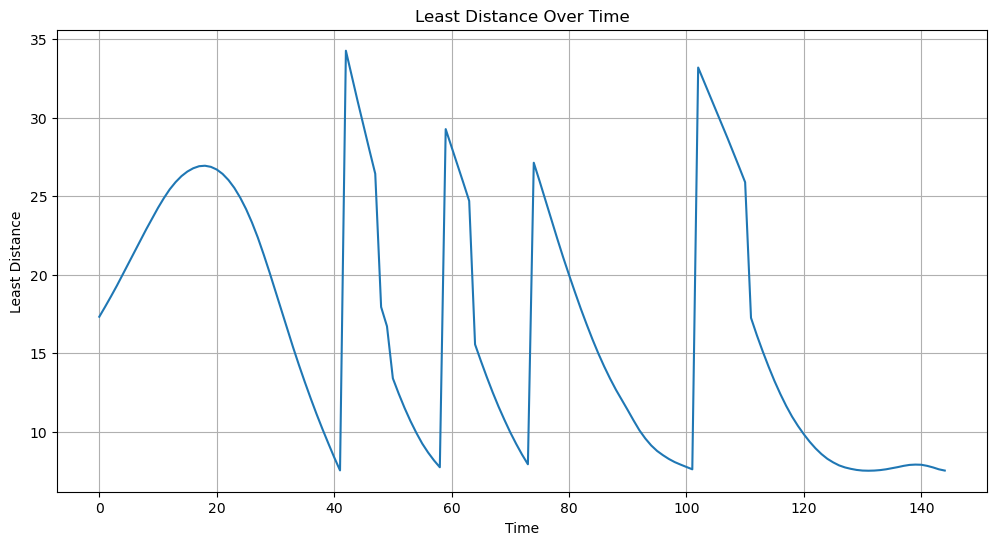

In [19]:
# Plotting
plt.figure(figsize=(12,6))
plt.plot(result_df['time'], result_df['least_distance'])
plt.title('Least Distance Over Time')
plt.xlabel('Time')
plt.ylabel('Least Distance')
plt.grid(True)
plt.show()

In [20]:
from datetime import datetime, timedelta
# Base timestamp (you can set this to any date and time you want)
base_timestamp = datetime(2021, 1, 1)

# Convert time to timedelta (assuming time is in seconds) and then to datetime
result_df['time'] = result_df['time'].apply(lambda x: base_timestamp + timedelta(seconds=x))

In [21]:
result_df

,time,id,x,y,angle,type,speed,pos,lane,slope,acceleration,nearest_vehicle_id,least_distance,relative_speed,vehicle_id,position
0,2021-01-01 00:00:00,EGOVEHICLE,190.11,4.80,270.00,EGOVEHICLE,9.24,23.96,-E1_1,0,-0.08,f_4.2,17.33,5.98,NaN,NaN
1,2021-01-01 00:00:01,EGOVEHICLE,189.19,4.80,270.00,EGOVEHICLE,9.23,24.88,-E1_1,0,-0.07,f_4.2,17.97,6.34,NaN,NaN
2,2021-01-01 00:00:02,EGOVEHICLE,188.26,4.80,270.00,EGOVEHICLE,9.25,25.81,-E1_1,0,0.23,f_4.2,18.63,6.62,NaN,NaN
3,2021-01-01 00:00:03,EGOVEHICLE,187.33,4.80,270.00,EGOVEHICLE,9.31,26.74,-E1_1,0,0.53,f_4.2,19.31,6.87,NaN,NaN
4,2021-01-01 00:00:04,EGOVEHICLE,186.40,4.80,270.00,EGOVEHICLE,9.39,27.67,-E1_1,0,0.83,f_4.2,20.03,7.04,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140,2021-01-01 00:02:20,NaN,-59.38,-41.24,33.37,EGOVEHICLE,13.16,NaN,E5_0,0,3.06,f_1.2,7.91,0.20,EGOVEHICLE,71.41
141,2021-01-01 00:02:21,NaN,-58.64,-40.11,33.37,EGOVEHICLE,13.49,NaN,E5_0,0,3.36,f_1.2,7.84,0.68,EGOVEHICLE,72.76
142,2021-01-01 00:02:22,NaN,-57.90,-38.99,33.37,EGOVEHICLE,13.36,NaN,E5_0,0,-1.30,f_1.2,7.74,0.98,EGOVEHICLE,74.10
143,2021-01-01 00:02:23,NaN,-57.17,-37.88,33.37,EGOVEHICLE,13.31,NaN,E5_0,0,-0.50,f_1.2,7.62,1.24,EGOVEHICLE,75.43


In [22]:
train_dates = result_df['time']

In [23]:
result_df

,time,id,x,y,angle,type,speed,pos,lane,slope,acceleration,nearest_vehicle_id,least_distance,relative_speed,vehicle_id,position
0,2021-01-01 00:00:00,EGOVEHICLE,190.11,4.80,270.00,EGOVEHICLE,9.24,23.96,-E1_1,0,-0.08,f_4.2,17.33,5.98,NaN,NaN
1,2021-01-01 00:00:01,EGOVEHICLE,189.19,4.80,270.00,EGOVEHICLE,9.23,24.88,-E1_1,0,-0.07,f_4.2,17.97,6.34,NaN,NaN
2,2021-01-01 00:00:02,EGOVEHICLE,188.26,4.80,270.00,EGOVEHICLE,9.25,25.81,-E1_1,0,0.23,f_4.2,18.63,6.62,NaN,NaN
3,2021-01-01 00:00:03,EGOVEHICLE,187.33,4.80,270.00,EGOVEHICLE,9.31,26.74,-E1_1,0,0.53,f_4.2,19.31,6.87,NaN,NaN
4,2021-01-01 00:00:04,EGOVEHICLE,186.40,4.80,270.00,EGOVEHICLE,9.39,27.67,-E1_1,0,0.83,f_4.2,20.03,7.04,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140,2021-01-01 00:02:20,NaN,-59.38,-41.24,33.37,EGOVEHICLE,13.16,NaN,E5_0,0,3.06,f_1.2,7.91,0.20,EGOVEHICLE,71.41
141,2021-01-01 00:02:21,NaN,-58.64,-40.11,33.37,EGOVEHICLE,13.49,NaN,E5_0,0,3.36,f_1.2,7.84,0.68,EGOVEHICLE,72.76
142,2021-01-01 00:02:22,NaN,-57.90,-38.99,33.37,EGOVEHICLE,13.36,NaN,E5_0,0,-1.30,f_1.2,7.74,0.98,EGOVEHICLE,74.10
143,2021-01-01 00:02:23,NaN,-57.17,-37.88,33.37,EGOVEHICLE,13.31,NaN,E5_0,0,-0.50,f_1.2,7.62,1.24,EGOVEHICLE,75.43


In [24]:
result_df.set_index('time', inplace=True)

In [25]:
from statsmodels.tsa.stattools import adfuller
def ad_test(dataset):
     dftest = adfuller(dataset, autolag = 'AIC')
     print("1. ADF : ",dftest[0])
     print("2. P-Value : ", dftest[1])
     print("3. Num Of Lags : ", dftest[2])
     print("4. Num Of Observations Used For ADF Regression:",      dftest[3])
     print("5. Critical Values :")
     for key, val in dftest[4].items():
         print("\t",key, ": ", val)

In [26]:
ad_test(result_df['least_distance'])

1. ADF :  -3.1388381302869557
2. P-Value :  0.02380934070029029
3. Num Of Lags :  0
4. Num Of Observations Used For ADF Regression: 144
5. Critical Values :
	 1% :  -3.476597917537401
	 5% :  -2.8818291230495543
	 10% :  -2.5775887982253085


In [37]:
 from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.varmax import VARMAX
from statsmodels.tsa.api import VAR
from statsmodels.tsa.stattools import grangercausalitytests, adfuller
from tqdm import tqdm_notebook
from itertools import product

import matplotlib.pyplot as plt
import statsmodels.api as sm
import pandas as pd
import numpy as np

import warnings
warnings.filterwarnings('ignore')

In [38]:
# Selecting the relevant columns
columns = ['relative_speed', 'least_distance']

# Splitting the dataset into training and testing sets
train_df = result_df[columns][:-20]  # All data except the last 12 observations
test_df = result_df[columns][-20:]   # Last 12 observations


In [39]:
train_df.diff()

,relative_speed,least_distance
time,,
2021-01-01 00:00:00,NaN,NaN
2021-01-01 00:00:01,0.36,0.64
2021-01-01 00:00:02,0.28,0.66
2021-01-01 00:00:03,0.25,0.68
2021-01-01 00:00:04,0.17,0.72
...,...,...
2021-01-01 00:02:00,-0.56,-0.53
2021-01-01 00:02:01,-0.61,-0.48
2021-01-01 00:02:02,-0.50,-0.42


In [40]:
model = VAR(train_df.diff()[1:])

In [41]:
sorted_order=model.select_order(maxlags=7)
print(sorted_order.summary())


 VAR Order Selection (* highlights the minimums) 
      AIC         BIC         FPE         HQIC   
-------------------------------------------------
0       2.542       2.589       12.70       2.561
1       2.270      2.412*       9.681      2.328*
2      2.262*       2.498      9.606*       2.358
3       2.309       2.640       10.07       2.443
4       2.372       2.797       10.73       2.545
5       2.407       2.926       11.11       2.618
6       2.450       3.064       11.61       2.699
7       2.504       3.213       12.27       2.792
-------------------------------------------------


In [42]:
var_model = VARMAX(train_df, order=(9,0),enforce_stationarity= True)
fitted_model = var_model.fit(disp=True)
print(fitted_model.summary())

                                    Statespace Model Results                                    
Dep. Variable:     ['relative_speed', 'least_distance']   No. Observations:                  125
Model:                                           VAR(9)   Log Likelihood                -461.726
                                            + intercept   AIC                           1005.453
Date:                                  Mon, 11 Dec 2023   BIC                           1121.414
Time:                                          15:19:10   HQIC                          1052.562
Sample:                                      01-01-2021                                         
                                           - 01-01-2021                                         
Covariance Type:                                    opg                                         
Ljung-Box (L1) (Q):             0.00, 0.34   Jarque-Bera (JB):     1905.11, 3153.28
Prob(Q):                        0.99, 0.56 

In [43]:
n_forecast = 20
predict = fitted_model.get_prediction(start=len(train_df),end=len(train_df) + n_forecast-1)#start="1989-07-01",end='1999-01-01')

predictions=predict.predicted_mean

In [44]:
predictions.columns=['relative_speed_pred','least_distance_pred']
predictions

,relative_speed_pred,least_distance_pred
2021-01-01 00:02:05,3.814424,12.371563
2021-01-01 00:02:06,4.603573,15.876892
2021-01-01 00:02:07,5.358343,18.796974
2021-01-01 00:02:08,6.041753,21.137591
2021-01-01 00:02:09,6.687422,23.042483
2021-01-01 00:02:10,7.241114,24.176867
2021-01-01 00:02:11,7.659273,24.637410
2021-01-01 00:02:12,7.997194,24.797791
2021-01-01 00:02:13,8.202103,24.625259
2021-01-01 00:02:14,8.250744,23.904727


In [45]:
test_vs_pred=pd.concat([test_df,predictions],axis=1)

In [46]:
test_vs_pred

,relative_speed,least_distance,relative_speed_pred,least_distance_pred
2021-01-01 00:02:05,2.35,8.06,3.814424,12.371563
2021-01-01 00:02:06,1.85,7.87,4.603573,15.876892
2021-01-01 00:02:07,1.29,7.74,5.358343,18.796974
2021-01-01 00:02:08,0.93,7.65,6.041753,21.137591
2021-01-01 00:02:09,0.60,7.58,6.687422,23.042483
2021-01-01 00:02:10,0.40,7.54,7.241114,24.176867
2021-01-01 00:02:11,0.14,7.53,7.659273,24.637410
2021-01-01 00:02:12,0.08,7.54,7.997194,24.797791
2021-01-01 00:02:13,0.33,7.57,8.202103,24.625259
2021-01-01 00:02:14,0.51,7.62,8.250744,23.904727


<Axes: >

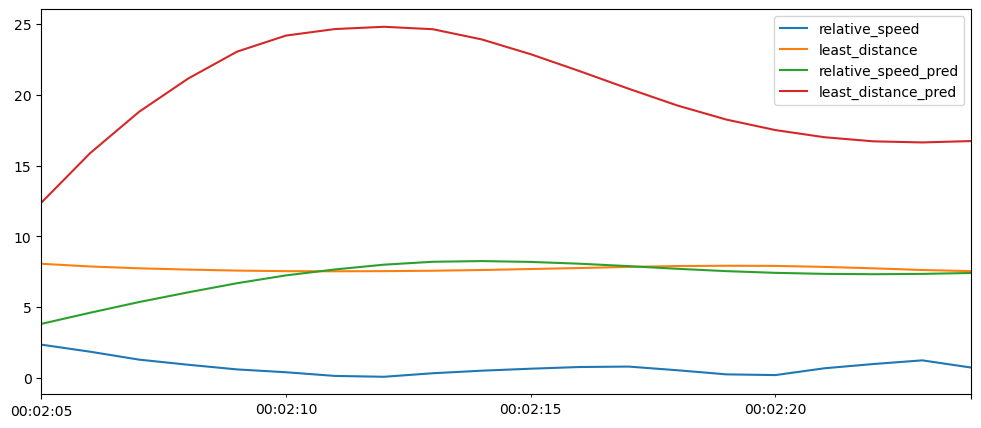

In [47]:
test_vs_pred.plot(figsize=(12,5))